In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch

In [9]:
from google.colab import files
files.upload()

Saving train.csv to train (1).csv


{'train.csv': b'id,country,description,points,price,province,variety\n0,US,"A nice starter Pinot for the price. Will introduce newcomers to the variety\'s light, silky texture and savory berry and spice flavors, touched with smoky oak.",86,14.0,California,Pinot Noir\n1,Germany,"This wine comes out of the bottle a little cranky, but give it some time in the glass and the initial stink gives way to notes of lime, apple and peach. It\'s plump in feel, with some dusty minerality and dried spices adding nuance to the sweet fruit.",90,18.0,Mosel-Saar-Ruwer,Riesling\n2,US,"This easy-drinking Pinot Noir offers layers of softened cola, pomegranates, red licorice and pepper, wrapped into supple tannins. It\'s ready to drink now with everything from tuna tartare to roasted salmon and grilled burgers.",85,28.0,California,Pinot Noir\n3,France,"An attractive and ripely fruited Cab, this opens with lush aromas of blackberry, raspberry preserves and black plum that are complemented by spicy notes of b

In [28]:
## Load data
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')
train_df.drop(columns=train_df.columns[0], 
        axis=1, 
        inplace=True) ## remove first column of train data

In [29]:
train_df

,country,description,points,price,province,variety
0,US,A nice starter Pinot for the price. Will intro...,86,14.0,California,Pinot Noir
1,Germany,This wine comes out of the bottle a little cra...,90,18.0,Mosel-Saar-Ruwer,Riesling
2,US,This easy-drinking Pinot Noir offers layers of...,85,28.0,California,Pinot Noir
3,France,"An attractive and ripely fruited Cab, this ope...",88,17.0,France Other,Cabernet Sauvignon
4,US,The vineyard is located in the western part of...,93,75.0,California,Pinot Noir
...,...,...,...,...,...,...
57051,US,"Enticing, subtle pear, mango and nutmeg aromas...",92,40.0,California,Chardonnay
57052,US,Very fresh on the nose but with an underlying ...,93,55.0,California,Chardonnay
57053,US,Very delicious in terms of sheer flavor. Flood...,87,45.0,California,Pinot Noir
57054,US,The nose of this bottling is quite shy. After ...,85,20.0,California,Cabernet Sauvignon


In [30]:
test_df

,id,country,description,points,price,province
0,57056,US,This cuvée gets some extra time in 40% new woo...,90,35.0,Oregon
1,57057,France,This is a ripe wine with a good balance betwee...,92,NaN,Burgundy
2,57058,US,Shows off the reasons why Dry Creek has achiev...,87,20.0,California
3,57059,Italy,"Here's a Cab with aromas of beef broth, cigar ...",87,NaN,Tuscany
4,57060,New Zealand,"A bold, fruit-driven style of Sauvignon Blanc,...",88,13.0,Marlborough
...,...,...,...,...,...,...
14261,71317,US,"The aromas of this rosé of Cabernet Sauvignon,...",86,14.0,Virginia
14262,71318,France,This powerful effort is holding back on its ri...,93,NaN,Bordeaux
14263,71319,US,This wine consists of all five red Bordeaux va...,88,55.0,California
14264,71320,US,"Here's a likeable Chard, with peach, pear and ...",85,19.0,California


In [31]:
train_df.shape, test_df.shape

((57056, 6), (14266, 6))

### EDA

In [32]:
train_df['variety'].value_counts()

Pinot Noir                  10617
Chardonnay                   9402
Cabernet Sauvignon           7577
Red Blend                    7157
Bordeaux-style Red Blend     5532
Riesling                     4151
Sauvignon Blanc              3973
Syrah                        3314
Rosé                         2851
Merlot                       2482
Name: variety, dtype: int64

In [33]:
# get max len of sentences
def max_len(data):
    return train_df['description'].apply(lambda x: len(x.split())).max()

max_lens = [max_len(train_df)]
max(max_lens)

135

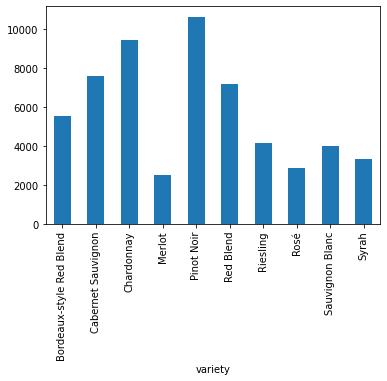

In [34]:
train_df.groupby(['variety']).size().plot.bar()
plt.show() 

In [35]:
#pip install transformers

In [36]:
# Load Huggingface transformers
from transformers import TFBertModel,  BertConfig, BertTokenizerFast, TFAutoModel

# Then what you need from tensorflow.keras
from tensorflow.keras.layers import Input, Dropout, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import TruncatedNormal
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.utils import to_categorical

import tensorflow as tf
from sklearn.model_selection import train_test_split

In [37]:
## Try-out
from transformers import BertTokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-cased')

example_text = 'I love data science'
bert_input = tokenizer(example_text,padding='max_length', max_length = 16, 
                       truncation=True, return_tensors="pt")

In [38]:
print(bert_input['input_ids'])
print(bert_input['token_type_ids'])
print(bert_input['attention_mask'])

tensor([[ 101,  146, 1567, 2233, 2598,  102,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0]])
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])
tensor([[1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


In [39]:
train_df['variety'].unique()

array(['Pinot Noir', 'Riesling', 'Cabernet Sauvignon', 'Red Blend',
       'Bordeaux-style Red Blend', 'Chardonnay', 'Merlot',
       'Sauvignon Blanc', 'Syrah', 'Rosé'], dtype=object)

In [40]:
data = train_df
data

,country,description,points,price,province,variety
0,US,A nice starter Pinot for the price. Will intro...,86,14.0,California,Pinot Noir
1,Germany,This wine comes out of the bottle a little cra...,90,18.0,Mosel-Saar-Ruwer,Riesling
2,US,This easy-drinking Pinot Noir offers layers of...,85,28.0,California,Pinot Noir
3,France,"An attractive and ripely fruited Cab, this ope...",88,17.0,France Other,Cabernet Sauvignon
4,US,The vineyard is located in the western part of...,93,75.0,California,Pinot Noir
...,...,...,...,...,...,...
57051,US,"Enticing, subtle pear, mango and nutmeg aromas...",92,40.0,California,Chardonnay
57052,US,Very fresh on the nose but with an underlying ...,93,55.0,California,Chardonnay
57053,US,Very delicious in terms of sheer flavor. Flood...,87,45.0,California,Pinot Noir
57054,US,The nose of this bottling is quite shy. After ...,85,20.0,California,Cabernet Sauvignon


In [41]:
labels = {'Pinot Noir':0,
          'Riesling':1,
          'Cabernet Sauvignon':2,
          'Red Blend':3,
          'Bordeaux-style Red Blend':4,
          'Chardonnay':5,
          'Merlot':6,
          'Sauvignon Blanc':7,
          'Syrah':8,
          'Rosé':9
          }

data['variety'].replace(labels,inplace=True)

In [42]:
data= data[['description','variety']]

In [43]:
X_train, X_val, y_train, y_val = train_test_split(data['description'], 
                                                  data['variety'], 
                                                  test_size=0.2, 
                                                  random_state=42, 
                                                  stratify=data['variety'])

data['data_type'] = ['not_set']*data.shape[0]
data.loc[X_train.index, 'data_type'] = 'train'
data.loc[X_val.index, 'data_type'] = 'val'


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


In [44]:
data['data_type'].value_counts()

train    45644
val      11412
Name: data_type, dtype: int64

In [45]:
dff=[len(i.split(" ")) for i in data.description]
max(dff)

135

In [46]:
# Name of the BERT model to use
model_name = 'bert-base-cased'

# Max length of tokens
max_length = max(dff)+20

# Load transformers config and set output_hidden_states to False
config = BertConfig.from_pretrained(model_name)
config.output_hidden_states = False

# Load BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained(pretrained_model_name_or_path = model_name, 
                                              config = config)

In [47]:
# Build your model input
input_ids = Input(shape=(max_length,), name='input_ids', dtype='int32')
attention_mask = Input(shape=(max_length,), name='attention_mask', dtype='int32') 
inputs = {'input_ids': input_ids, 'attention_mask': attention_mask}

bert = TFAutoModel.from_pretrained('bert-base-cased')
embeddings = bert.bert(inputs)[1]  # access pooled activations with [1]

# convert bert embeddings into 10 output classes
x =Dense(1024, activation='relu')(embeddings)
y =Dense(10, activation='softmax', name='outputs')(x)

model = Model(inputs=inputs, outputs=y)
#model.layers[2].trainable = False

# Take a look at the model
model.summary()

Some layers from the model checkpoint at bert-base-cased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-cased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 attention_mask (InputLayer)    [(None, 155)]        0           []                               
                                                                                                  
 input_ids (InputLayer)         [(None, 155)]        0           []                               
                                                                                                  
 bert (TFBertMainLayer)         TFBaseModelOutputWi  108310272   ['attention_mask[0][0]',         
                                thPoolingAndCrossAt               'input_ids[0][0]']              
                                tentions(last_hidde                                               
                                n_state=(None, 155,                                           

In [48]:
y_variety = to_categorical(data[data.data_type=='train'].variety)
# Tokenize the input 
x = tokenizer(
    text=data[data.data_type=='train'].description.to_list(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = True,
    verbose = True)

train=tf.data.Dataset.from_tensor_slices((x['input_ids'], x['attention_mask'], y_variety))
def map_func(input_ids, masks, labels):
    # convert three-item tuple into a two-item tuple where the input item is a dictionary
    return {'input_ids': input_ids, 'attention_mask': masks}, labels

train = train.map(map_func)
batch_size = 16

# shuffle and batch - dropping any remaining samples that don't cleanly
train = train.shuffle(100).batch(batch_size, drop_remainder=True)

In [49]:
train.take(1)

<TakeDataset shapes: ({input_ids: (16, 155), attention_mask: (16, 155)}, (16, 10)), types: ({input_ids: tf.int32, attention_mask: tf.int32}, tf.float32)>

In [50]:
y_variety_test = to_categorical(data[data.data_type=='val'].variety)

# Tokenize the input 
x = tokenizer(
    text=data[data.data_type=='val'].description.to_list(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = True,
    verbose = True)

val = tf.data.Dataset.from_tensor_slices((x['input_ids'], x['attention_mask'], y_variety_test))
val = val.map(map_func)
val = val.shuffle(100).batch(batch_size, drop_remainder=True)

In [51]:
optimizer = Adam(lr=1e-4, decay=1e-5)
loss = CategoricalCrossentropy()
acc = CategoricalAccuracy('accuracy')
model.compile(optimizer=optimizer, loss=loss, metrics=[acc])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [53]:
history = model.fit(
    train,
    validation_data=val,epochs=2)

Epoch 1/2
2852/2852 [==============================] - 3116s 1s/step - loss: 0.8415 - accuracy: 0.7158 - val_loss: 0.7324 - val_accuracy: 0.7564
Epoch 2/2
2852/2852 [==============================] - 3115s 1s/step - loss: 0.6984 - accuracy: 0.7661 - val_loss: 0.6997 - val_accuracy: 0.7703


In [54]:
test_df

,id,country,description,points,price,province
0,57056,US,This cuvée gets some extra time in 40% new woo...,90,35.0,Oregon
1,57057,France,This is a ripe wine with a good balance betwee...,92,NaN,Burgundy
2,57058,US,Shows off the reasons why Dry Creek has achiev...,87,20.0,California
3,57059,Italy,"Here's a Cab with aromas of beef broth, cigar ...",87,NaN,Tuscany
4,57060,New Zealand,"A bold, fruit-driven style of Sauvignon Blanc,...",88,13.0,Marlborough
...,...,...,...,...,...,...
14261,71317,US,"The aromas of this rosé of Cabernet Sauvignon,...",86,14.0,Virginia
14262,71318,France,This powerful effort is holding back on its ri...,93,NaN,Bordeaux
14263,71319,US,This wine consists of all five red Bordeaux va...,88,55.0,California
14264,71320,US,"Here's a likeable Chard, with peach, pear and ...",85,19.0,California


In [55]:
x = tokenizer(
    text=test_df['description'].to_list(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = True,
    verbose = True)

In [56]:
items=tf.data.Dataset.from_tensor_slices((x['input_ids'],x['attention_mask']))

In [57]:
def map_func(input_ids, masks):
    return {'input_ids': input_ids, 'attention_mask': masks}

items = items.map(map_func)
items = items.batch(16)

In [58]:
predictions=model.predict(items).argmax(axis=-1)


In [62]:
test_df

,id,country,description,points,price,province
0,57056,US,This cuvée gets some extra time in 40% new woo...,90,35.0,Oregon
1,57057,France,This is a ripe wine with a good balance betwee...,92,NaN,Burgundy
2,57058,US,Shows off the reasons why Dry Creek has achiev...,87,20.0,California
3,57059,Italy,"Here's a Cab with aromas of beef broth, cigar ...",87,NaN,Tuscany
4,57060,New Zealand,"A bold, fruit-driven style of Sauvignon Blanc,...",88,13.0,Marlborough
...,...,...,...,...,...,...
14261,71317,US,"The aromas of this rosé of Cabernet Sauvignon,...",86,14.0,Virginia
14262,71318,France,This powerful effort is holding back on its ri...,93,NaN,Bordeaux
14263,71319,US,This wine consists of all five red Bordeaux va...,88,55.0,California
14264,71320,US,"Here's a likeable Chard, with peach, pear and ...",85,19.0,California


In [60]:
predictions

array([0, 5, 6, ..., 3, 5, 2])

In [67]:
submission = pd.DataFrame()
submission['id'] = test_df['id']
submission['variety'] = predictions
variety = {0:'Pinot Noir',
          1:'Riesling',
          2:'Cabernet Sauvignon',
          3:'Red Blend',
          4:'Bordeaux-style Red Blend',
          5:'Chardonnay',
          6:'Merlot',
          7:'Sauvignon Blanc',
          8:'Syrah',
          9:'Rosé'
          }
submission.replace(variety,inplace=True)
submission.to_csv("submission.csv", index=False)
submission

,id,variety
0,57056,Pinot Noir
1,57057,Chardonnay
2,57058,Merlot
3,57059,Cabernet Sauvignon
4,57060,Sauvignon Blanc
...,...,...
14261,71317,Rosé
14262,71318,Bordeaux-style Red Blend
14263,71319,Red Blend
14264,71320,Chardonnay


In [68]:
files.download("submission.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>